In [1]:
# Imports. Nothing to see here.

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import string
from pprint import pprint

from imblearn.over_sampling import SMOTE
from gensim.models import Word2Vec
import gensim
from gensim.utils import simple_preprocess
from collections import Counter
import gensim.corpora as corpora

import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from nltk import FreqDist, word_tokenize
from nltk.tokenize import RegexpTokenizer

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report, plot_confusion_matrix, confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, train_test_split as tts
from sklearn.naive_bayes import MultinomialNB
import random

import sqlite3
from textblob import TextBlob
from wordcloud import WordCloud

from sklearn.cluster import KMeans
import pickle

import plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from sklearn.decomposition import PCA

from surprise import Reader, Dataset
from surprise.prediction_algorithms import KNNBasic
from surprise.model_selection import cross_validate
from surprise.model_selection import train_test_split
from surprise import accuracy
from sklearn.model_selection import train_test_split as tts
from surprise.dataset import DatasetAutoFolds
from surprise.prediction_algorithms.matrix_factorization import SVD
from surprise.model_selection import GridSearchCV
from collections import defaultdict

import pyLDAvis.gensim
import pyLDAvis

# Part 2

The second half of this project will require two more models with two different goals. First, we will take our dataset that consists of misclassified data and attempt to classify it more accurately. Second, we will create a custom recommender system for our podcast database, which has its own unique problem we will creatively solve later.

In [2]:
# Our DataFrames from part 1.

filtered = pd.read_pickle("./filtered")
data = pd.read_pickle("./data")

C:\Users\tcmca\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [3]:
# Let's compare our value counts between actual values of our filtered DataFrame and our predicted values once again.

print('Actual rating counts: \n', filtered.rating.value_counts().sort_index(),'\n')
print('Predicted rating counts: \n', filtered['predict'].value_counts().sort_index(), '\n')

filtered['difference'] = abs(filtered['rating'] - filtered['predict'])

Actual rating counts: 
 1     11021
2      4568
3      5676
4      9722
5    218837
Name: rating, dtype: int64 

Predicted rating counts: 
 1     41290
2     30716
3     43523
4    127105
5      7190
Name: predict, dtype: int64 

C:\Users\tcmca\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [4]:
# As discussed previously, there is very little difference in ratings directly next to each other. Our average misclassification was 1.57, so let's keep our data limited to significant misclassifications higher than the average.

filtered = filtered[filtered['difference'] >= 2]
filtered.shape[0]

C:\Users\tcmca\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



106980

With our new standards for acceptable error, our data set is down to approximately 107,000 entries. That's 7.5% of our original set. 

Below, we'll visualize what this looks like.

C:\Users\tcmca\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



<Figure size 648x432 with 0 Axes>

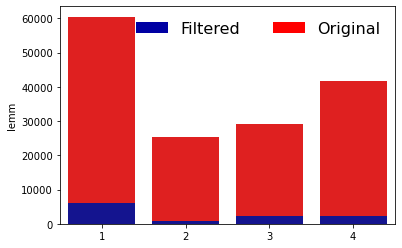

In [5]:
# Bar chart to show our data reduction. Our first chart will leave of the rating of '5,' as it is still vastly imbalanced and would make the chart difficult to read.

plt.figure(figsize=(9,6))

datanot5 = data[data['rating'] < 5]
filterednot5 = filtered[filtered['rating']<5]
plt.show()

#Plot 1 - background - "total" (top) series
sns.barplot(x = [1,2,3,4], y = datanot5.groupby('rating')['lemm'].count(), color = "red")

#Plot 2 - overlay - "bottom" series
sns.barplot(x = [1,2,3,4], y = filterednot5.groupby('rating')['lemm'].count(), color = "#0000A3")

topbar = plt.Rectangle((0,0),1,1,fc="red", edgecolor = 'none')
bottombar = plt.Rectangle((0,0),1,1,fc='#0000A3',  edgecolor = 'none')
l = plt.legend([bottombar, topbar], ['Filtered', 'Original'], loc=1, ncol = 2, prop={'size':16})
l.draw_frame(False)
plt.show()

C:\Users\tcmca\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



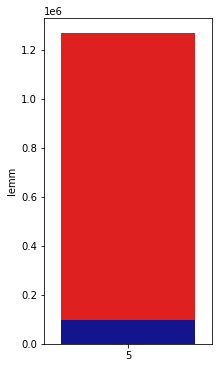

In [6]:
# Now just the '5' rating, measured in millions.

plt.figure(figsize=(3,6))
data5 = data[data['rating'] == 5]
filtered5 = filtered[filtered['rating']==5]

#Plot 1 - background - "total" (top) series
sns.barplot(x = [5], y = data5.groupby('rating')['lemm'].count(), color = "red")

#Plot 2 - overlay - "bottom" series
sns.barplot(x = [5], y = filtered5.groupby('rating')['lemm'].count(), color = "#0000A3")

topbar = plt.Rectangle((0,0),1,1,fc="red", edgecolor = 'none')
bottombar = plt.Rectangle((0,0),1,1,fc='#0000A3',  edgecolor = 'none')

Now we get to focus exclusively on data that's difficult to predict.

In [7]:
# Use our Vectorizer trained on our entire dataset to transform our new, smaller dataset. We'll compare it using our previously trained Logistic Regression model and a new Random Forest model.

tf = pickle.load(open("tf.p", "rb"))

X_train, X_test, y_train, y_test = tts(filtered['lemm'], filtered['rating'])
tf_train = tf.transform(X_train)
tf_test = tf.transform(X_test)

C:\Users\tcmca\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



C:\Users\tcmca\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



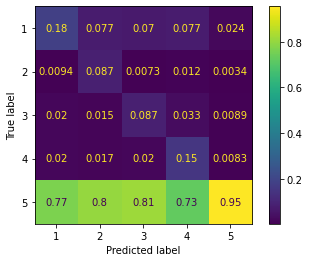

In [8]:
clf = pickle.load(open('clf', 'rb'))
clf.fit(tf_train, y_train)
plot_confusion_matrix(clf, tf_test, y_test, normalize='pred')
plt.show()

C:\Users\tcmca\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



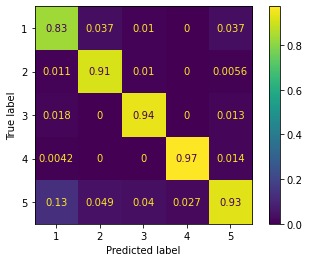

In [9]:
rf = RandomForestClassifier()
rf.fit(tf_train, y_train)
plot_confusion_matrix(rf, tf_test, y_test, normalize='pred')
plt.show()

Comparing our two models, two things become very clear. 
First is that our previous Logistic Regression model does not work well on our current data. It overwhelmingly predicts our data to be rating '5.' This makes sense, given that this dataset is made entirely up of the datapoints that this exact model could not correctly identify.

The second is that our Random Forest has performed extremely well at exactly matching our ratings. Even its lowest performing rating, '1' seems to have most of its error predicting it as a '5.' This points again to our earlier two issues: the model misattributing one extreme statement for its opposite, and user error.

# Creating a User Based Recommender System

Now it's time to create a recommendation system. The surprise library is highly regarded in its ability to create a user based recommender system. It requires three lists: user ids, item ids, and the user's ratings. Our data set is missing user ids.

One option we have is to create a content based recommender system, which we have everything needed. But where's the fun in that? To achieve our goal of a user based system, we're going to have to simulate our missing user data.

In [10]:
# We apply K means clustering, an unsupervised learning algorithm, to our data and ask it to return 500 clusters. Each of these clusters will have a number of reviews similar in its written construction to simulate a user leaving multiple reviews. Now we have 500 users.

clusters = tf.transform(filtered['lemm'])
kmeans1000 = KMeans(n_clusters=500, random_state=42, n_init=1, max_iter=3, verbose=3, n_jobs=-1)
kmeans1000.fit(clusters)
filtered['cluster'] = y_kmeans = kmeans1000.predict(clusters)

C:\Users\tcmca\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

Initialization complete
Iteration 0, inertia 104023.43717268613
Iteration 1, inertia 100327.85742785127
Iteration 2, inertia 98047.88624896095


In [11]:
# Now we use our created users, along with the titles of our podcasts and our ratings to create a recommender system using the surprise library.

rec = filtered[['cluster', 'slug', 'rating']]

reader = Reader(rating_scale=(1, 5))
rec = Dataset.load_from_df(rec, reader)

train, test = train_test_split(rec, test_size=0.2)

C:\Users\tcmca\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [12]:
# Now we fit an SVD model to our training data to make predictions for our test data and view the first five results.

model = SVD().fit(train)
predictions = model.test(test)
predictions[0:5]

C:\Users\tcmca\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



[Prediction(uid=169, iid='ted talks daily sd video', r_ui=5.0, est=4.77598028665446, details={'was_impossible': False}),
 Prediction(uid=0, iid='the joe rogan experience', r_ui=5.0, est=5, details={'was_impossible': False}),
 Prediction(uid=127, iid='cinema adventures podcast', r_ui=5.0, est=4.728178849187208, details={'was_impossible': False}),
 Prediction(uid=220, iid='a little about a lot', r_ui=5.0, est=4.81412715622953, details={'was_impossible': False}),
 Prediction(uid=426, iid='nintendo dads podcast', r_ui=5.0, est=3.748860184699433, details={'was_impossible': False})]

In [13]:
accuracy.rmse(predictions)

RMSE: 0.9192
C:\Users\tcmca\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



0.9192389845629044

Our RMSE is under 1, meaning our predictions are wrong by less than one rating on average! We'd like to get that smaller, but it represents a large improvement over our logistic regression model, and on a dataset comprised of the most difficult data to predict. These are very good results.

In [14]:
# This is taken from the surprise documentation, so I'll leave it intact aside from some minor changes at the bottom. Here, our recommender system is created.

def get_top_n(predictions, n=5):
    """Return the top-N recommendation for each user from a set of predictions.

    Args:
        predictions(list of Prediction objects): The list of predictions, as
            returned by the test method of an algorithm.
        n(int): The number of recommendation to output for each user. Default
            is 10.

    Returns:
    A dict where keys are user (raw) ids and values are lists of tuples:
        [(raw item id, rating estimation), ...] of size n.
    """

    # First map the predictions to each user.
    top_n = defaultdict(list)
    for uid, iid, true_r, est, _ in predictions:
        top_n[uid].append((iid, est))

    # Then sort the predictions for each user and retrieve the k highest ones.
    for uid, user_ratings in top_n.items():
        user_ratings.sort(key=lambda x: x[1], reverse=True)
        top_n[uid] = user_ratings[:n]

    return top_n


top_n = get_top_n(predictions, n=5)

# Print the recommended items for each user
for uid, user_ratings in top_n.items():
    print(f'User {uid} would enjoy these podcasts:''\n')
    print([iid.upper() for (iid, _) in user_ratings])
    print('\n')


ON PODCAST']


User 183 would enjoy these podcasts:

['NEW RADIO', 'STRANGLERS', 'SCALE OR DIE', 'BIG BOY PANTS PODCAST', 'BEAUTIFUL NIGHT WITH BEN BANACH']


User 496 would enjoy these podcasts:

['IMPACTFUL', 'INVISIBILIA', 'RADIOLAB', 'RADIOLAB', 'RADIOLAB']


User 269 would enjoy these podcasts:

['CLOVERFEELS', 'EMIL AMOS DRIFTERS SYMPATHY', 'DEAR HANK JOHN', 'ESCAPE VELOCITY RADIO', 'PENCIL SIX EPISODE SERIES ABOUT JOHN WICK UNIVERSE']


User 232 would enjoy these podcasts:

['FOR THE LOVE OF DOG', 'FOR THE LOVE OF DOG']


User 281 would enjoy these podcasts:

['WHAT IF WORLD STORIES FOR KIDS', 'WHAT IF WORLD STORIES FOR KIDS', 'OVER THE KILL', 'COMEDY OLD TIME RADIO', 'TWO GIRLS ONE GHOST']


User 416 would enjoy these podcasts:

['FLUX']


User 255 would enjoy these podcasts:

['SHUTDOWN FULLCAST', 'FREE DAILY BIBLE STUDY PODCAST', 'NOBODY LISTENS TO PAULA POUNDSTONE', 'TRUE CRIME BULLSH THE STORY OF ISRAEL KEYES', 'GUYS WE F D']


User 227 would enjoy these podcasts:

['PARANO

# LDA analysis

Here we apply another unsupervised learning process to our data. LDA is specialized for NLP text data and groups the data by topics that it finds in the text. Using it can help with exploring how the information in your data relates to each other. In this case, we use it to simulate our 500 clustered simulated users. It's important to note that this is a different calculation of clusters, but similar in nature and helps to see the big picture.

In [15]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) 
             if word not in stop_words] for doc in texts]
stop_words = stopwords.words('english')
datum = filtered.lemm.values.tolist()
data_words = list(sent_to_words(datum))
# remove stop words
data_words = remove_stopwords(data_words)
print(data_words[:1][0][:30])

# Create Dictionary
id2word = corpora.Dictionary(data_words)
# Create Corpus
texts = data_words
# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]
# View
print(corpus[:1][0][:30])

C:\Users\tcmca\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

['much', 'trying', 'convince', 'racist', 'sexist', 'country', 'much', 'privilege', 'time', 'move']
[(0, 1), (1, 1), (2, 1), (3, 2), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1)]


In [16]:
# number of topics
num_topics = 500
# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics)

pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]


# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
# Save as HTML for easier access.
# pyLDAvis.save_html(vis, 'lda.html')
pyLDAvis.display(vis)

C:\Users\tcmca\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

[(291,
  '0.014*"recording" + 0.012*"love" + 0.011*"show" + 0.011*"like" + '
  '0.010*"say" + 0.009*"one" + 0.009*"mom" + 0.009*"money" + 0.009*"much" + '
  '0.008*"really"'),
 (233,
  '0.052*"speed" + 0.040*"dave" + 0.037*"need" + 0.036*"impression" + '
  '0.031*"greg" + 0.029*"show" + 0.025*"jesus" + 0.024*"casual" + '
  '0.023*"laughter" + 0.023*"analysis"'),
 (305,
  '0.014*"message" + 0.012*"love" + 0.011*"show" + 0.011*"lane" + '
  '0.011*"thank" + 0.011*"miss" + 0.010*"much" + 0.010*"really" + 0.010*"big" '
  '+ 0.009*"great"'),
 (93,
  '0.043*"love" + 0.024*"em" + 0.015*"tell" + 0.014*"ever" + 0.013*"get" + '
  '0.013*"christine" + 0.012*"idk" + 0.012*"

Reviewing the LDA graph, it's easy to see how this relates to our data. A huge clump of clusters correlates to our imbalanced dataset, with what would likely be our '5' rating. Many cluster nearby represent the middle ratings and especially those that are being misclassified as '5's. The end of the long tail is likely to be our '1' rating.